# Trabalho final - A80790
Dados obtidos de repositórios do github

* https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data

* https://github.com/open-covid-19/data e baseado em alguns dos exemplos apresentados neste.


Fazendo o load do dataset diretamente do URL com pandas

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

data = pd.read_csv('https://open-covid-19.github.io/data/data.csv')
data = data.set_index('Date')
cols = ['Confirmed', 'Deaths']
for col in cols: #para alterar os dados de float para inteiro
   data[col] = data[col].astype('Int64')
data.head()

,Key,CountryCode,CountryName,RegionCode,RegionName,Confirmed,Deaths,Latitude,Longitude,Population
Date,,,,,,,,,,
2020-01-13,MX,MX,Mexico,NaN,NaN,1,0,23.000000,-102.000000,130526945.0
2020-01-13,MX_AGU,MX,Mexico,AGU,Aguascalientes,0,0,22.021667,-102.356390,1312544.0
2020-01-13,MX_BCN,MX,Mexico,BCN,Baja California,0,0,29.950000,-115.116670,3315766.0
2020-01-13,MX_BCS,MX,Mexico,BCS,Baja California Sur,0,0,25.846111,-111.972780,39294.0
2020-01-13,MX_CAM,MX,Mexico,CAM,Campeche,0,0,18.836389,-90.403333,899931.0


In [37]:
#Imprimir uma porção do dataset
print('Este dataset contém %d linhas, aqui estão as últimas:' % len(data))
data.tail()

Este dataset contém 69874 linhas, aqui estão as últimas:


,Key,CountryCode,CountryName,RegionCode,RegionName,Confirmed,Deaths,Latitude,Longitude,Population
Date,,,,,,,,,,
2020-05-30,XK,XK,Kosovo,NaN,NaN,1048,30,42.550000,20.833333,1.883018e+06
2020-05-31,CN,CN,China,NaN,NaN,84569,4645,35.000000,103.000000,1.382793e+09
2020-05-31,CN_HK,CN,China,HK,Hong Kong,1082,4,22.278333,114.158610,7.500700e+06
2020-05-31,CN_SD,CN,China,SD,Shandong,791,7,36.400000,118.400000,9.579306e+07
2020-05-31,CN_TW,CN,China,TW,Taiwan,442,7,23.700000,121.000000,2.314000e+07


# Agrupar os casos por países

In [38]:
Paises_total=data.groupby('CountryName').agg({'Confirmed':'sum','Deaths':'sum'})

Função para colocar um mínimo de 100 casos para posteriormente ver o top 10 países com mais casos

In [48]:
def minimo_casos(Paises_total: pd.DataFrame, threshold: int = 100):
    ''' Returns a mask for > N confirmed cases '''
    return Paises_total['Confirmed'] > threshold


In [49]:
Paises_total = Paises_total[minimo_casos(Paises_total)]

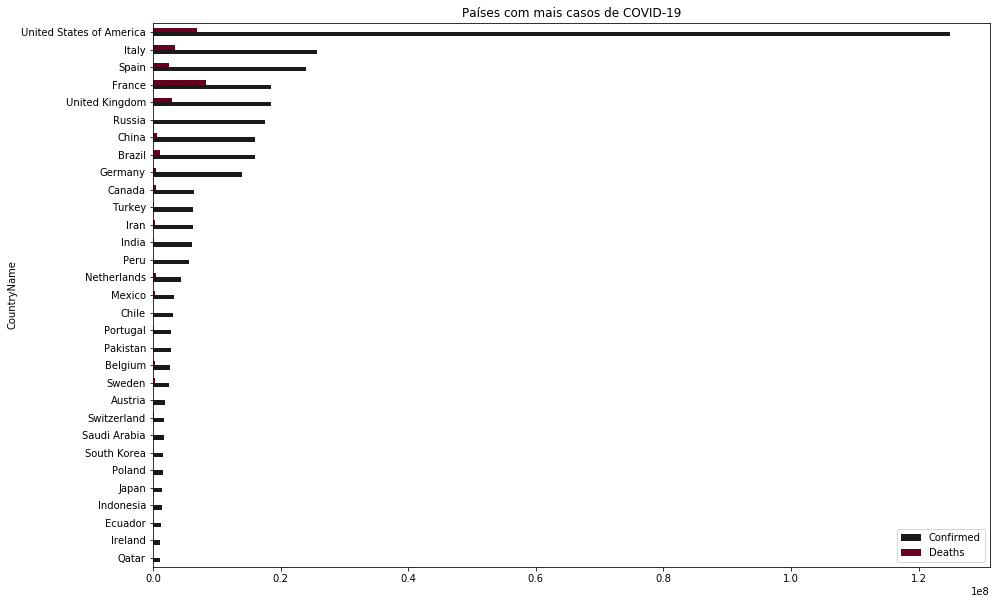

In [50]:
Paises_total.sort_values(by='Confirmed',ascending=True).plot(kind='barh',figsize=(15,10), title='Países com mais casos de COVID-19',colormap='RdGy_r');
plt.savefig('Figuras/Paises_BarraH.png', bbox_inches='tight')

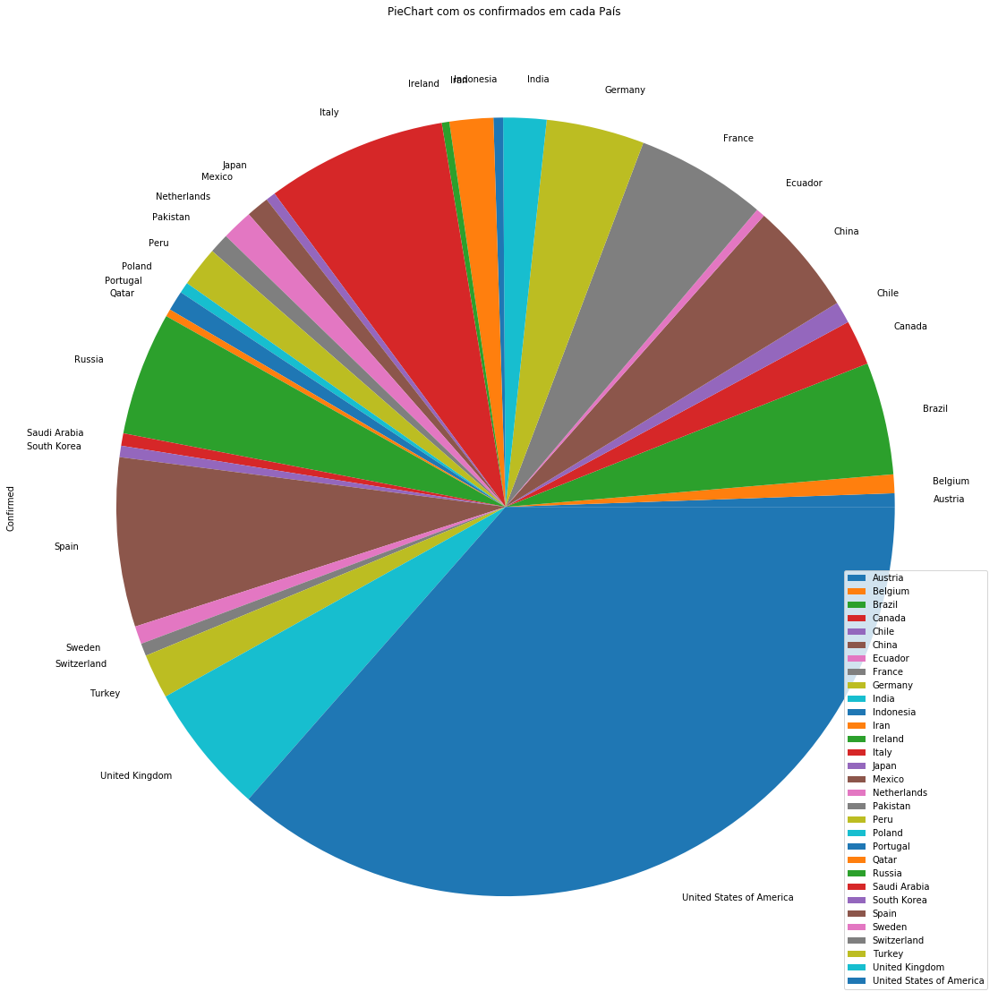

In [51]:
Paises_total.plot(kind='pie', y='Confirmed', figsize=(35,20), title='PieChart com os confirmados em cada País ')
plt.savefig('Figuras/Paises_pie.png', bbox_inches='tight')

Algumas seleções que se podem fazer com os dados.

In [51]:
# Procurar por colunas com o Regioncode nulo
countries = data[data['RegionCode'].isna()]

# Remover as colunas RegionCode e RegionName
countries = countries.drop(columns=['RegionCode', 'RegionName'])

countries.head()

,Key,CountryCode,CountryName,Confirmed,Deaths,Latitude,Longitude,Population
Date,,,,,,,,
2019-12-30,AE,AE,United Arab Emirates,0,0,24.400000,54.30,9400145.0
2019-12-30,AF,AF,Afghanistan,0,0,34.000000,66.00,34940837.0
2019-12-30,AM,AM,Armenia,0,0,40.383333,44.95,2930450.0
2019-12-30,AT,AT,Austria,0,0,48.000000,14.00,8809212.0
2019-12-30,AU,AU,Australia,0,0,-28.000000,137.00,24511800.0


In [52]:
#Filtrar os dados que tem o código de país certo e não tem código de região nulo
spain_regions = data[(data['CountryCode'] == 'ES') & ~(data['RegionCode'].isna())]

spain_regions.tail()

,Key,CountryCode,CountryName,RegionCode,RegionName,Confirmed,Deaths,Latitude,Longitude,Population
Date,,,,,,,,,,
2020-05-21,ES_ML,ES,Spain,ML,Melilla,134,2,35.282500,-2.947500,86487.0
2020-05-21,ES_NC,ES,Spain,NC,Navarra,8352,506,42.816667,-1.650000,647554.0
2020-05-21,ES_PV,ES,Spain,PV,País Vasco,18779,1483,42.983333,-2.616667,2189534.0
2020-05-21,ES_RI,ES,Spain,RI,La Rioja,5428,354,42.250000,-2.500000,315675.0
2020-05-21,ES_VC,ES,Spain,VC,Comunidad Valenciana,14797,1383,39.500000,-0.750000,5003769.0


In [59]:
# Filtrar os dados para espanha ao nível de países
spain_country = data[data['Key'] == 'ES']

# Remover as colunas ao nível das regiões
spain_country = spain_country.drop(columns=['RegionCode', 'RegionName'])

spain_country.tail()

,Key,CountryCode,CountryName,Confirmed,Deaths,Latitude,Longitude,Population
Date,,,,,,,,
2020-05-25,ES,ES,Spain,235400,26834,40.0,-3.0,46733038.0
2020-05-26,ES,ES,Spain,236259,27117,40.0,-3.0,46733038.0
2020-05-27,ES,ES,Spain,236769,27118,40.0,-3.0,46733038.0
2020-05-28,ES,ES,Spain,237906,27119,40.0,-3.0,46733038.0
2020-05-29,ES,ES,Spain,238564,27121,40.0,-3.0,46733038.0


In [62]:
# filtrar dados para Asturias, uma das sub-regiões de Espanha
asturias = data[data['Key'] == 'ES_AS']
asturias.tail()

,Key,CountryCode,CountryName,RegionCode,RegionName,Confirmed,Deaths,Latitude,Longitude,Population
Date,,,,,,,,,,
2020-05-17,ES_AS,ES,Spain,AS,Asturias,2370,301,43.333333,-6.0,1028244.0
2020-05-18,ES_AS,ES,Spain,AS,Asturias,2373,303,43.333333,-6.0,1028244.0
2020-05-19,ES_AS,ES,Spain,AS,Asturias,2374,304,43.333333,-6.0,1028244.0
2020-05-20,ES_AS,ES,Spain,AS,Asturias,2374,307,43.333333,-6.0,1028244.0
2020-05-21,ES_AS,ES,Spain,AS,Asturias,3359,307,43.333333,-6.0,1028244.0


Load de um dataset com apenas as colunas da data, das keys dos paises, dos confirmados e dos mortos para essas keys.

In [127]:
# Fazer o load do dataset com menos colunas
minimal = pd.read_csv('https://open-covid-19.github.io/data/data_minimal.csv')
minimal = minimal.set_index('Date')
minimal
#cols = ['Confirmed', 'Deaths']
#for col in cols:
 #  minimal[col] = minimal[col].astype('Int64')


#Função para colocar a aparecer os dados após 15 casos
def get_outbreak_mask(data: pd.DataFrame, threshold: int = 15):
    ''' Returns a mask for > N confirmed cases '''
    return data['Confirmed'] > threshold

Verificar num piechart os confirmados vs os mortos

In [128]:
soma=minimal.sum() #soma de todos os casos confirmados e de mortes no mundo

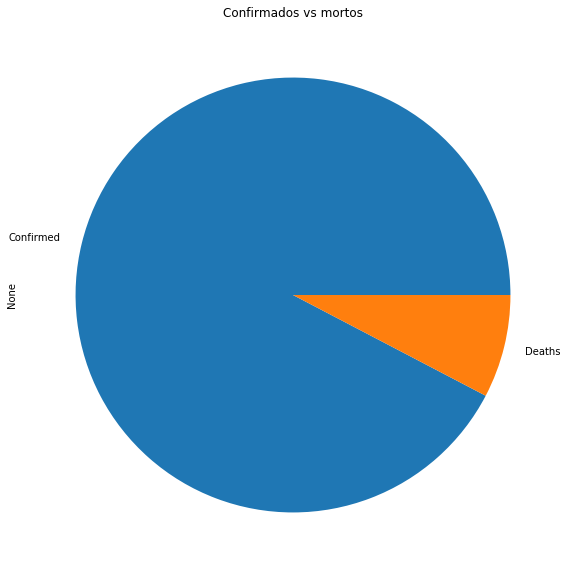

In [129]:
soma.plot(kind='pie',figsize=(20,10), title='Confirmados vs mortos');
plt.savefig('Figuras/Confirmados_mortos_pie.png', bbox_inches='tight')

# Gráfico com todos os confirmados e mortos no mundo por data

In [130]:
confirmados_total = minimal.groupby('Date').agg('sum') # soma dos dados
#confirmados_total.head()

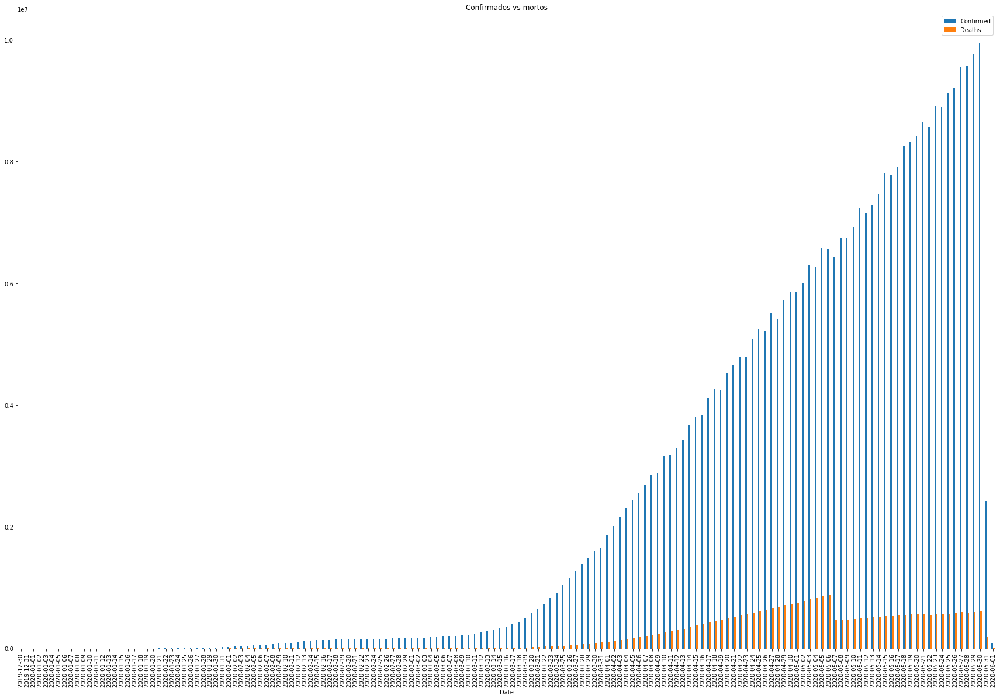

In [155]:
confirmados_total.plot(kind='bar',figsize=(30,20), title='Confirmados vs mortos');
plt.savefig('Figuras/Total_Confirmados.png', bbox_inches='tight')

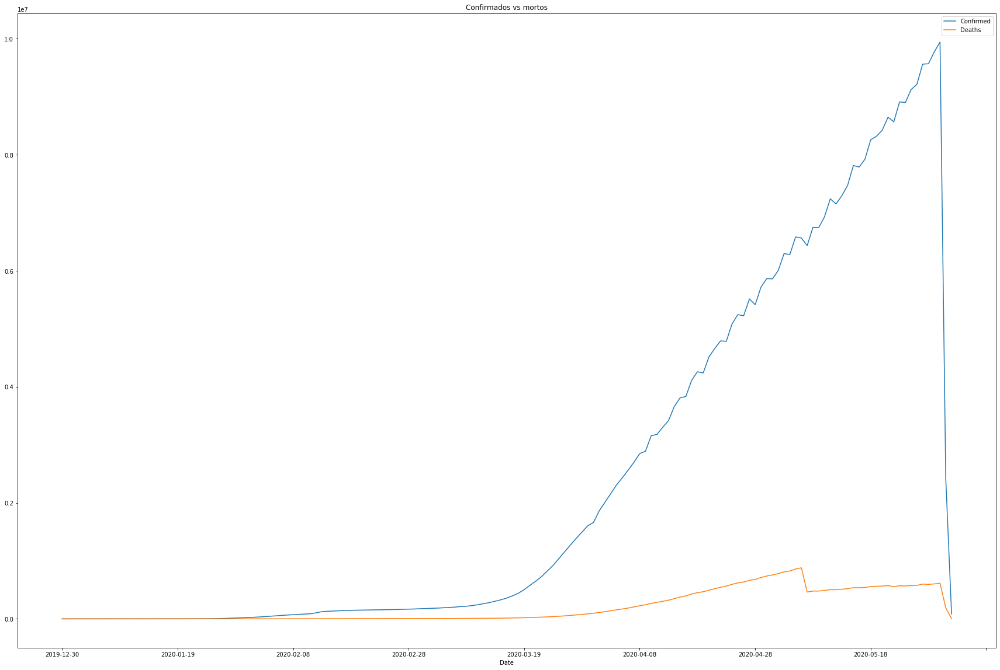

In [138]:
confirmados_total.plot(kind='line',figsize=(30,20), title='Confirmados vs mortos');
plt.savefig('Figuras/TotalConfirmadosLine.png', bbox_inches='tight')

### Confirmados e mortos em _Espanha_

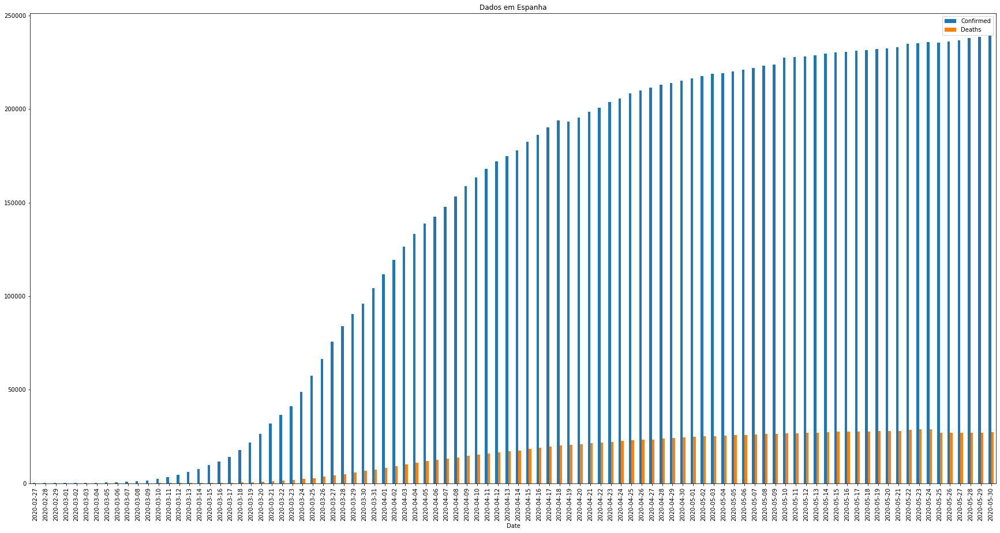

In [139]:
espanha = minimal[minimal['Key'] == 'ES']

#mostra os casos após o outbreak, neste caso, mínimo de 15 casos e até a data mais atual

espanha = espanha[get_outbreak_mask(espanha)]
#espanha.tail()

espanha.plot(kind='bar', figsize=(30, 15), title='Dados em Espanha');
plt.savefig('Figuras/Espanha_total.png', bbox_inches='tight')

In [140]:
# filtrar dados para Asturias, uma das sub-regiões de Espanha
asturias = minimal[minimal['Key'] == 'ES_AS']

asturias = asturias[get_outbreak_mask(asturias)]

#asturias.tail()

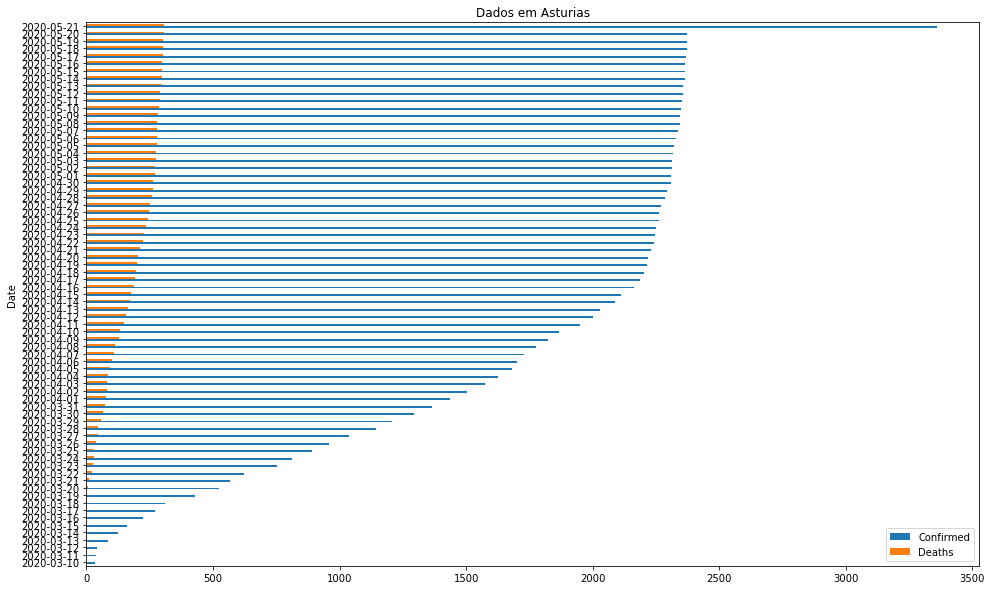

In [141]:
asturias.plot(kind='barh', figsize=(16, 10), title='Dados em Asturias');
plt.savefig('Figuras/AsturiasConfirmados.png', bbox_inches='tight')

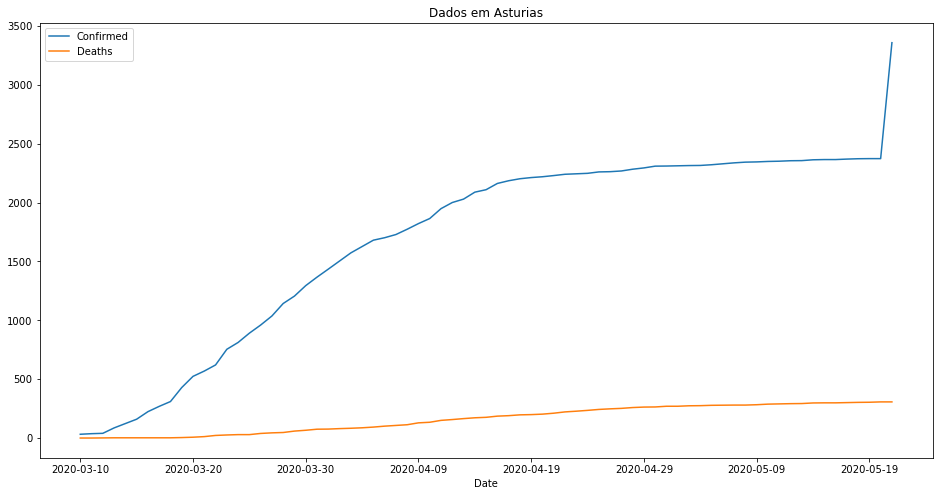

In [142]:
asturias.plot(figsize=(16,8), title='Dados em Asturias');
plt.savefig('Figuras/AsturiasLine.png', bbox_inches='tight')

# Ver casos para Itália - modelagem exponencial

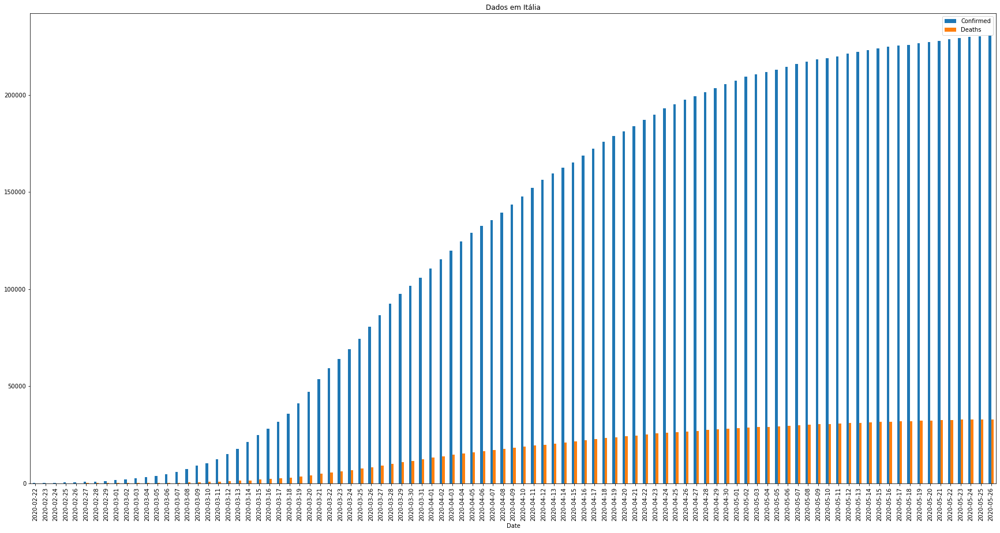

In [143]:
italia = minimal[minimal['Key'] == 'IT']
date_limit = '2020-05-26'

italia = italia[get_outbreak_mask(italia)]
italia = italia[italia.index <= date_limit]

italia.plot(kind='bar', figsize=(30, 15), title='Dados em Itália');
plt.savefig('Figuras/Italia_total.png', bbox_inches='tight')

A heurística encontrada para os dados da Itália está feita para a data 03-17-2020 portanto, utilizou-se essa data para os gráficos seguintes relativos à previsão de casos na Itália.

In [144]:
from scipy import optimize

date_limit = '2020-03-17'
italia = italia[italia.index <= date_limit]

def exponential_function(x: float, a: float, b: float, c: float):
    ''' a * (b ^ x) + c '''
    return a * (b ** x) + c

X, y = list(range(len(italia))), italia['Confirmed'].tolist()
params, _ = optimize.curve_fit(exponential_function, X, y)

print('Estimated function: {0:.3f} * ({1:.3f} ^ X) + {2:.3f}'.format(*params))

Estimated function: 950.195 * (1.161 ^ X) + -1399.440


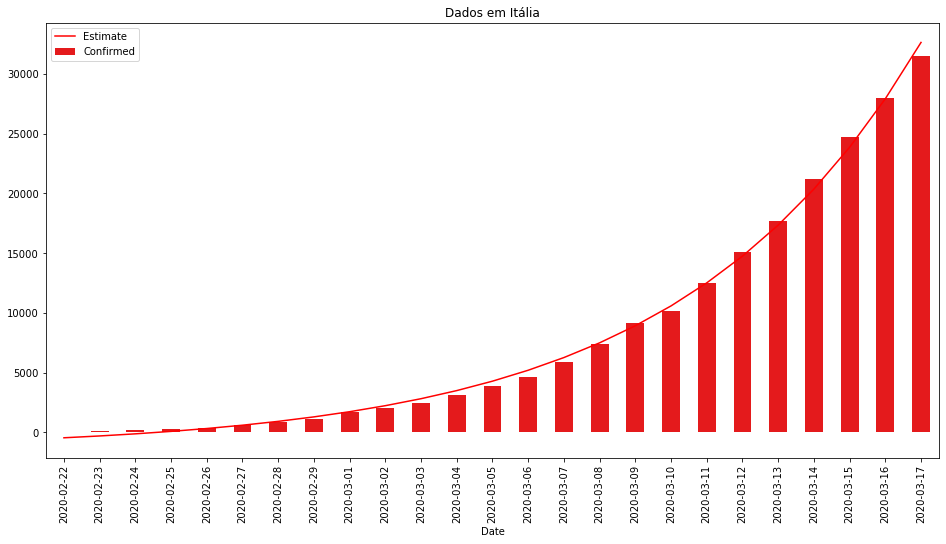

In [146]:
ax = italia[['Confirmed']].plot(kind='bar', figsize=(16, 8), colormap='Set1', title='Dados em Itália')
estimate = [exponential_function(x, *params) for x in X]
ax.plot(italia.index, estimate, color='red', label='Estimate')
ax.legend();
plt.savefig('Figuras/Italia_heuristica.png', bbox_inches='tight')

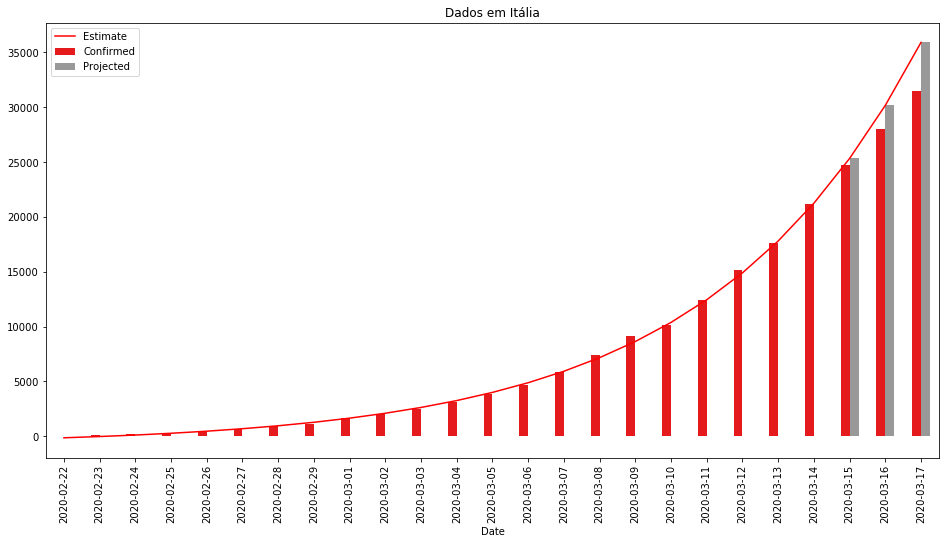

In [147]:
ESTIMATE_DAYS = 3
params_validate, _ = optimize.curve_fit(exponential_function, X[:-ESTIMATE_DAYS], y[:-ESTIMATE_DAYS])

# Project zero for all values except for the last ESTIMATE_DAYS
projected = [0] * len(X[:-ESTIMATE_DAYS]) + [exponential_function(x, *params_validate) for x in X[-ESTIMATE_DAYS:]]
projected = pd.Series(projected, index=italia.index, name='Projected')
df_ = pd.DataFrame({'Confirmed': italia['Confirmed'], 'Projected': projected})
ax = df_.plot(kind='bar', figsize=(16, 8),colormap='Set1', title='Dados em Itália')
estimate = [exponential_function(x, *params_validate) for x in X]
ax.plot(italia.index, estimate, color='red', label='Estimate')
ax.legend();
plt.savefig('Figuras/ItaliaEstimativa3dias.png', bbox_inches='tight')

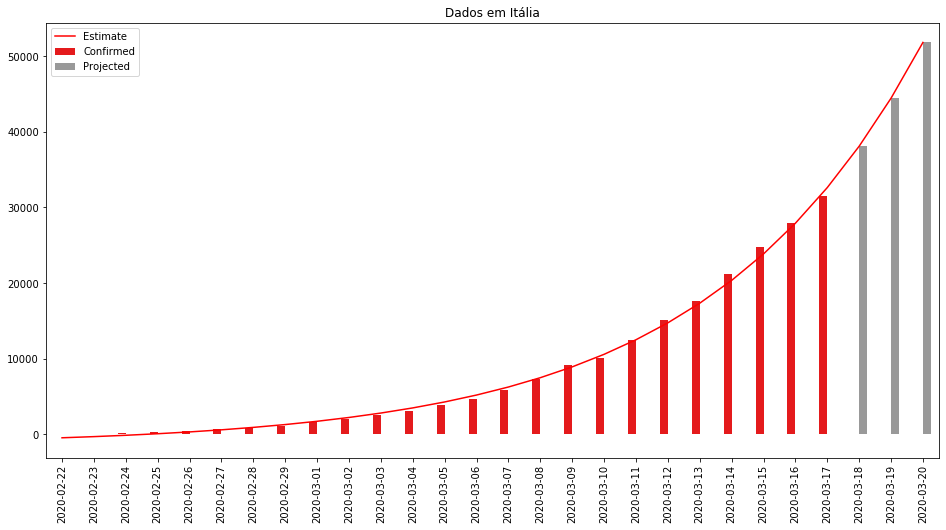

In [148]:
import datetime

FUTURE_DAYS = 3

# Append N new days to our indices
date_format = '%Y-%m-%d'
date_range = [datetime.datetime.strptime(date, date_format) for date in italia.index]
for _ in range(FUTURE_DAYS): date_range.append(date_range[-1] + datetime.timedelta(days=1))
date_range = [datetime.datetime.strftime(date, date_format) for date in date_range]

# Perform projection with the previously estimated parameters
projected = [0] * len(X) + [exponential_function(x, *params) for x in range(len(X), len(X) + FUTURE_DAYS)]
projected = pd.Series(projected, index=date_range, name='Projected')
df_ = pd.DataFrame({'Confirmed': italia['Confirmed'], 'Projected': projected})
ax = df_.plot(kind='bar', figsize=(16, 8),colormap='Set1', title='Dados em Itália')
estimate = [exponential_function(x, *params) for x in range(len(date_range))]
ax.plot(date_range, estimate, color='red', label='Estimate')
ax.legend();
plt.savefig('Figuras/ItaliaFuturo3dias.png', bbox_inches='tight')

# Ver casos  para Coreia do Sul - modelagem logística

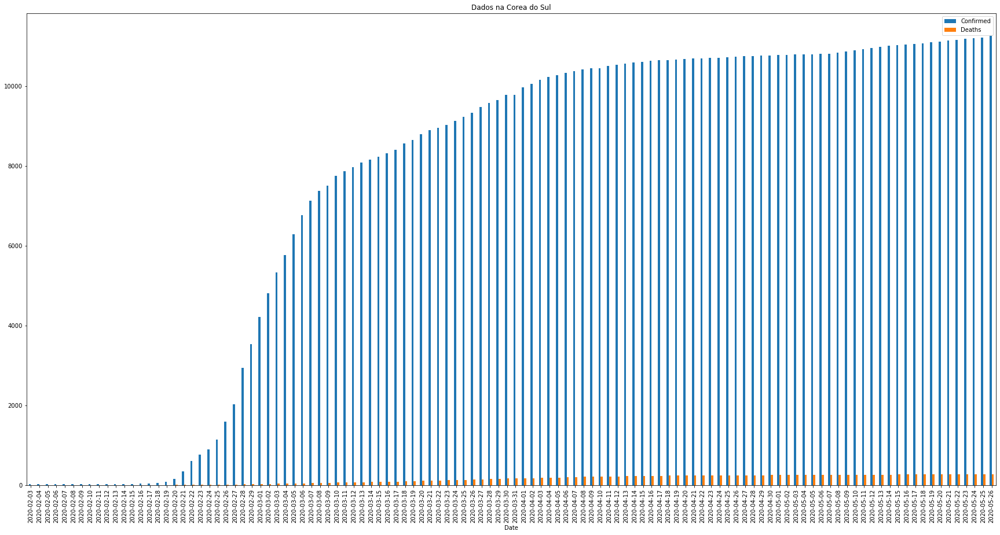

In [149]:
coreaS = minimal[minimal['Key'] == 'KR']
date_limit = '2020-05-26'

coreaS = coreaS[get_outbreak_mask(coreaS)]
coreaS = coreaS[coreaS.index <= date_limit]

coreaS.plot(kind='bar', figsize=(30, 15), title='Dados na Corea do Sul');
plt.savefig('Figuras/CoreaSulTotal.png', bbox_inches='tight')

A heurística encontrada para os dados da Coreia do Sul está feita para a data 2020-03-18 portanto, utilizou-se essa data para os gráficos seguintes relativos à previsão de casos na Coreia do Sul.

In [150]:
import math
import numpy as np
from scipy import optimize

date_limit = '2020-03-18'
coreaS = coreaS[coreaS.index <= date_limit]


In [151]:
def logistic_function(x: float, a: float, b: float, c: float):
    ''' a * e^(-b * e^(-cx)) '''
    return a * np.exp(-b * np.exp(-c * x))

X, y = list(range(len(coreaS))), coreaS['Confirmed'].tolist()
# Providing a reasonable initial guess is crucial for this model
params, _ = optimize.curve_fit(logistic_function, X, y, maxfev=int(1E5), p0=[max(y), np.median(X), .1])

print('Estimated function: {0:.3f} * e^(-{1:.3f} * e^(-{2:.3f}X))'.format(*params))

Estimated function: 8713.133 * e^(-153.142 * e^(-0.198X))


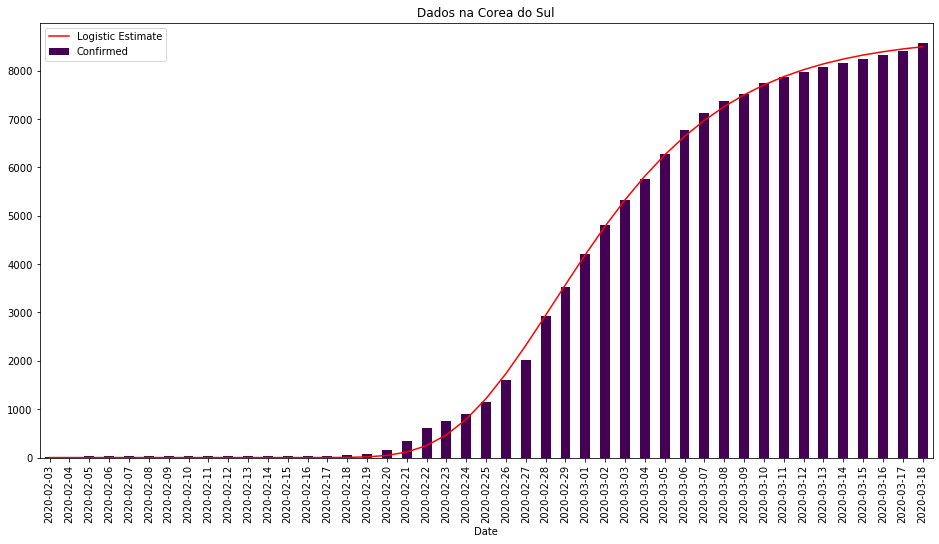

In [152]:
ax = coreaS[['Confirmed']].plot(kind='bar', figsize=(16, 8), colormap='viridis', title='Dados na Corea do Sul')
estimate = [logistic_function(x, *params) for x in X]
ax.plot(coreaS.index, estimate, color='red', label='Logistic Estimate')
ax.legend();
plt.savefig('Figuras/CoreaSHeuristicaGomperstz.png', bbox_inches='tight')

C:\OSGEO4~1\apps\Python37\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in exp
  This is separate from the ipykernel package so we can avoid doing imports until


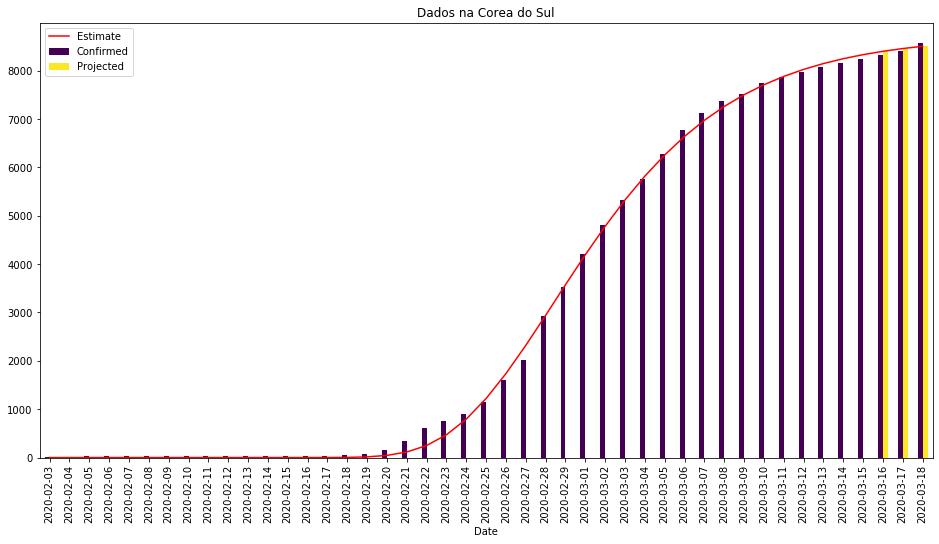

In [153]:

ESTIMATE_DAYS = 3
X_, y_ = X[:-ESTIMATE_DAYS], y[:-ESTIMATE_DAYS]
params_validate, _ = optimize.curve_fit(logistic_function, X_, y_, maxfev=int(1E5), p0=[max(y_), np.median(X_), .01])

# Project zero for all values except for the last ESTIMATE_DAYS
projected = [0] * len(X_) + [logistic_function(x, *params_validate) for x in X[-ESTIMATE_DAYS:]]
projected = pd.Series(projected, index=coreaS.index, name='Projected')
df_ = pd.DataFrame({'Confirmed': coreaS['Confirmed'], 'Projected': projected})
ax = df_.plot(kind='bar', figsize=(16, 8), colormap='viridis', title='Dados na Corea do Sul')
estimate = [logistic_function(x, *params_validate) for x in X]
ax.plot(coreaS.index, estimate, color='red', label='Estimate')
ax.legend();
plt.savefig('Figuras/CoreaSEstimativa.png', bbox_inches='tight')

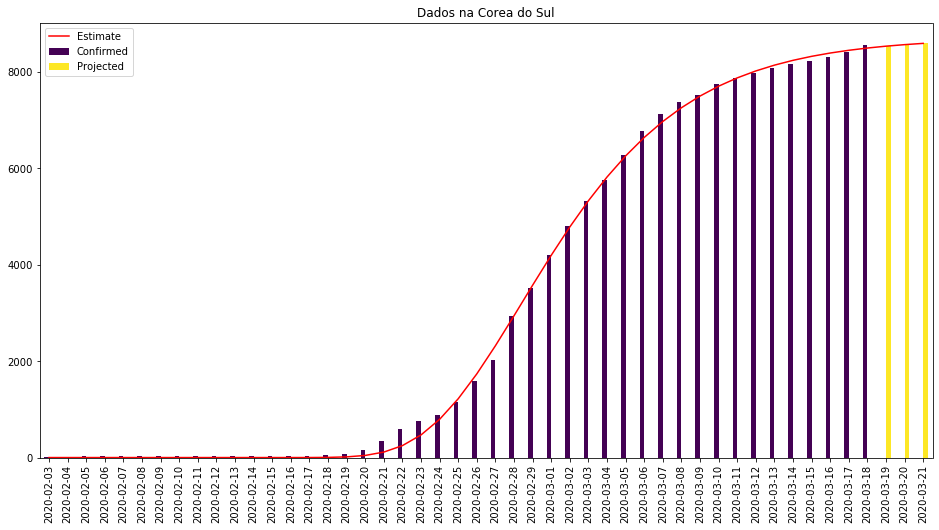

In [154]:
import datetime

FUTURE_DAYS = 3

# Append N new days to our indices
date_format = '%Y-%m-%d'
date_range = [datetime.datetime.strptime(date, date_format) for date in coreaS.index]
for _ in range(FUTURE_DAYS): date_range.append(date_range[-1] + datetime.timedelta(days=1))
date_range = [datetime.datetime.strftime(date, date_format) for date in date_range]

# Perform projection with the previously estimated parameters
projected = [0] * len(X) + [logistic_function(x, *params) for x in range(len(X), len(X) + FUTURE_DAYS)]
projected = pd.Series(projected, index=date_range, name='Projected')
df_ = pd.DataFrame({'Confirmed': coreaS['Confirmed'], 'Projected': projected})
ax = df_.plot(kind='bar', figsize=(16, 8), colormap='viridis', title='Dados na Corea do Sul')
estimate = [logistic_function(x, *params) for x in range(len(date_range))]
ax.plot(date_range, estimate, color='red', label='Estimate')
ax.legend();
plt.savefig('Figuras/CoreaSFuturo3Dias.png', bbox_inches='tight')

# Estimar casos atuais por categoria 

Aqui explora-se uma metodologia para estimar pacientes atuais com estados leves, graves e críticos. As categorias leve e crítica parecem estar correlacionadas com categorias relatadas de forma independente do Ministério da Saúde da Itália.

A maioria dos relatórios de dados do COVID-19, incluindo o que é relatado pelo ECDC, concentra-se nas contagens diárias de novos casos e mortes. Embora isso seja útil para rastrear o desenvolvimento geral da doença, fornece poucas informações sobre a capacidade exigida por um sistema de saúde para lidar com a carga de casos. Aqui, exploramos uma metodologia para estimar o total de casos ativos (casos entre início e recuperação / morte), discriminados por categoria.

# Descriminação dos casos
Dados iniciais da China classificaram os casos em leves, graves e críticos, com 80,9%, 13,8% e 4,7% das ocorrências, respectivamente.

Embora isso possa ser útil para categorizar os casos, não parece coincidir com alguns dados baseados em resultados, como a taxa de hospitalização, onde, em 26 de março, a Itália registrou 43,2%, Espanha 56,80% e Nova York 15% de todos os casos confirmados.


Essa diferença grande nas taxas de hospitalização pode ser devida a diferentes critérios que são usados nos sistemas de saúde, além de atingir limites potenciais de capacidade do sistema. Portanto, as estimativas realizadas aqui não podem ser usadas como proxy para as taxas de hospitalização, a menos que um fator de correção dependente do país seja aplicado. No entanto, o uso de uma estimativa de 5% de todos os casos parece ser um bom preditor para as taxas de admissão na UTI, e 15% de todos os casos parecem correlacionar-se a uma taxa de casos confirmados que apresentam apenas sintomas leves.

In [102]:
# Como os números relatados são aproximados, eles são arredondados por uma questão de simplicidade
severe_ratio = .15
critical_ratio = .05
mild_ratio = 1 - severe_ratio - critical_ratio

In [103]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()

# Tempo médio até ser dada a alta a casos graves e críticos

Dados iniciais de fontes da China só reportam uma estadia média de 12.8 para todas as internações sem especificar quais necessitavam de recursos na UCI.


Como se conhece a proporção de casos graves x casos críticos, é apenas preciso adivinhar o tempo de alta dos casos graves, pois haverá apenas uma maneira de satisfazer a restrição da mediana e média geral da hospitalização. Aqui, fez-se o gráfico o tempo estimado de descarga para casos críticos (eixo y), dado um tempo de descarga para casos graves (eixo x):

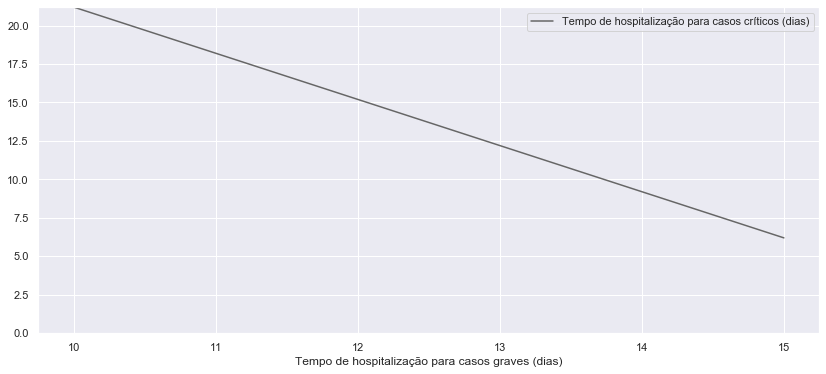

In [115]:
# Dados dos primeiros relatórios chineses
mean_discharge_time = 12.8
severe_ratio_norm = severe_ratio / (severe_ratio + critical_ratio) 
critical_ratio_norm = critical_ratio / (severe_ratio + critical_ratio) 

def compute_icu_discharge_time(severe_discharge_time, mean_discharge_time: float = 12.8):
    ''' Usando o tempo média até ser dada a alta retirado de https://www.cnn.com/2020/03/20/health/covid-19-recovery-rates-intl/index.html '''
    return (mean_discharge_time - severe_discharge_time * severe_ratio_norm) / critical_ratio_norm

X = np.linspace(10, 15, 100)
y = np.array([compute_icu_discharge_time(x) for x in X])

X_name = 'Tempo de hospitalização para casos graves (dias)'
y_name = 'Tempo de hospitalização para casos críticos (dias)'
df = pd.DataFrame([(x, y_) for x, y_ in zip(X, y)], columns=[X_name, y_name]).set_index(X_name)
df.plot(kind='line',figsize=(14, 6), grid=True, ylim=(0, max(y)), colormap='Accent_r');
plt.savefig('Figuras/TempoHospitalizacao.png', bbox_inches='tight')

Como os dados são relatados diariamente, pode-se escolher apenas um número inteiro estimado para as duas variáveis. Escolheu-se um valor para alta hospitalar de casos graves de 12 dias. Em seguida, os dias estimados para a alta da UTI são de 15 dias.

In [116]:
severe_recovery_days = 12
critical_recovery_days = 15

# Tempo de recuperação para casos leves

Para estimar o número atual de casos leves, há mais um número que se deve adivinhar: quantos dias leva para a recuperação, em média, para todos os casos que não são graves ou críticos. Os tempos de recuperação relatados de uma infecção por COVID-19 variam de 2 semanas [(fonte)](https://www.who.int/docs/default-source/coronaviruse/who-china-joint-mission-on-covid-19-final-report.pdf) a uma semana ou 10 dias [(fonte)](https://www.webmd.com/lung/news/20200324/the-other-side-of-covid-19-milder-cases-recovery#1). O uso de um tempo médio de recuperação de 7 dias parece corresponder aos dados empíricos de vários relatórios oficiais.

In [117]:
mild_recovery_days = 7

# Estimando a discriminação de novos casos

Usando os dados da Itália até 26 de março, assumindo que a proporção de cada categoria permaneça constante para cada novo caso, as quebras diárias podem ser estimadas multiplicando o número de novos casos pelas proporções das respectivas categorias:

In [118]:
# Load dos dados de Itália
data = pd.read_csv('https://open-covid-19.github.io/data/data.csv')
data = data[(data['CountryCode'] == 'IT') & (data['RegionCode'].isna())]

# Estimar contagens diárias por categoria, assumindo que a proporção é constante
data = data.set_index('Date')
data = data[data.index <= '2020-03-27']
data['NewCases'] = data['Confirmed'].diff()
data['NewDeaths'] = data['Deaths'].diff()
data['NewMild'] = data['NewCases'] * mild_ratio
data['NewSevere'] = data['NewCases'] * severe_ratio
data['NewCritical'] = data['NewCases'] * critical_ratio
data = data[['NewCases', 'NewDeaths', 'NewMild', 'NewSevere', 'NewCritical']]

data.tail()

,NewCases,NewDeaths,NewMild,NewSevere,NewCritical
Date,,,,,
2020-03-23,4789.0,601.0,3831.2,718.35,239.45
2020-03-24,5249.0,743.0,4199.2,787.35,262.45
2020-03-25,5210.0,683.0,4168.0,781.50,260.50
2020-03-26,6153.0,662.0,4922.4,922.95,307.65
2020-03-27,5959.0,969.0,4767.2,893.85,297.95


# Estimando a decomposição dos casos atuais

Agora que temos uma estimativa para a divisão de novos casos por categoria, bem como para o tempo de descarga por categoria, pode-se estimar o número de casos atuais por categoria adicionando cada categoria em uma janela contínua:

In [119]:
data['CurrentlyMild'] = data['NewMild'].rolling(round(mild_recovery_days)).sum()
data['CurrentlySevere'] = data['NewSevere'].rolling(round(severe_recovery_days)).sum()
data['CurrentlyCritical'] = data['NewCritical'].rolling(round(critical_recovery_days)).sum()
data.tail()

,NewCases,NewDeaths,NewMild,NewSevere,NewCritical,CurrentlyMild,CurrentlySevere,CurrentlyCritical
Date,,,,,,,,
2020-03-23,4789.0,601.0,3831.2,718.35,239.45,28757.6,7719.75,2827.60
2020-03-24,5249.0,743.0,4199.2,787.35,262.45,30136.0,8109.45,3000.20
2020-03-25,5210.0,683.0,4168.0,781.50,260.50,30938.4,8508.90,3211.85
2020-03-26,6153.0,662.0,4922.4,922.95,307.65,31603.2,8907.30,3403.85
2020-03-27,5959.0,969.0,4767.2,893.85,297.95,31581.6,9262.65,3569.25


# Comparando com a assistência domiciliar na Itália, hospitalizações e contagem de UCI

A Itália classifica os casos em atendimento domiciliar, hospitalizações e internação em UTI, que parecem mapear bem em categorias leves, graves e críticas. Do ministério da saúde da Itália, esta é a repartição em 26 de março de casos em comparação com as estimativas de o modelo aqui utilizado:

In [120]:
estimated = data.iloc[-1]
reported = pd.DataFrame.from_records([
    {'Category': 'CurrentlyMild', 'Count': 30920},
    {'Category': 'CurrentlySevere', 'Count': 23112},
    {'Category': 'CurrentlyCritical', 'Count': 3489},
]).set_index('Category')

pd.DataFrame.from_records([
    {
        'Category': col, 
        'Estimated': '{0:.02f}%'.format(estimated[col]),
        'Reported': reported.loc[col, 'Count'],
        'Difference': '{0:.02f}%'.format(100.0 * (estimated[col]  - reported.loc[col, 'Count']) / reported.loc[col, 'Count']),
    }
    for col in reported.index.tolist()
]).set_index('Category')

,Estimated,Reported,Difference
Category,,,
CurrentlyMild,31581.60%,30920,2.14%
CurrentlySevere,9262.65%,23112,-59.92%
CurrentlyCritical,3569.25%,3489,2.30%


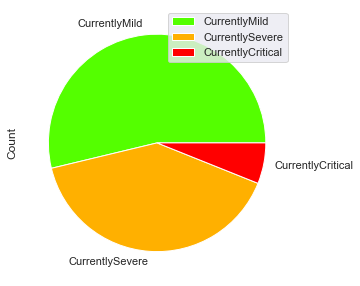

In [128]:
reported.plot.pie(y='Count', figsize=(5, 5), colormap='prism_r');
plt.savefig('Figuras/CasosLevesGravesCriticos.png', bbox_inches='tight')


# Importação de dados para visualização de mapas mundo

In [129]:
import os
import sys
from osgeo import ogr
os.environ['QT_QPA_PLATFORM'] = 'offscreen'
from qgis.core import *
from qgis.gui import *
from qgis import processing
import qgis.utils

from qgis.PyQt.QtGui import QColor, QImage
from qgis.PyQt.QtCore import QSize, QBuffer, QIODevice, QVariant

qgs = QgsApplication([], False)
qgs.initQgis()
print(QgsApplication.showSettings())

sys.path.append(r'C:\OSGeo4W64\apps\qgis\python\plugins')
import numpy as np
#import matplotlib.pyplot as plt
#import pandas as pd
from qgis.core import *
from qgis.PyQt.QtGui import *
from qgis.PyQt.QtCore import *
from IPython.display import Image


import datetime

Application state:
QGIS_PREFIX_PATH env var:		C:/OSGEO4~1/apps/qgis
Prefix:		C:/OSGEO4~1/apps/qgis
Plugin Path:		C:/OSGEO4~1/apps/qgis/plugins
Package Data Path:	C:/OSGEO4~1/apps/qgis/.
Active Theme Name:	
Active Theme Path:	C:/OSGEO4~1/apps/qgis/./resources/themes\\icons/
Default Theme Path:	:/images/themes/default/
SVG Search Paths:	C:/OSGEO4~1/apps/qgis/./svg/
		C:/Users/claud/AppData/Roaming/python3\profiles\default/svg/
User DB Path:	C:/OSGEO4~1/apps/qgis/./resources/qgis.db
Auth DB Path:	C:/Users/claud/AppData/Roaming/python3\profiles\default/qgis-auth.db



Fazendo o load dos datasets com dados do mundo para a criação de gráficos.

In [130]:
import requests

if not os.path.exists('COVID'):
    os.mkdir("COVID")
    
r = requests.get(r"https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv")  
with open(r'COVID/time_series_covid19_confirmed_global.csv', 'wb') as f:
    f.write(r.content)
r = requests.get(r"https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv")  
with open(r'COVID/time_series_covid19_deaths_global.csv', 'wb') as f:
    f.write(r.content)
r = requests.get(r"https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv")  
with open(r'COVID/time_series_covid19_recovered_global.csv', 'wb') as f:
    f.write(r.content)

import urllib.parse
cwd = urllib.parse.quote(os.getcwd() )


uri = r"file:///{}/COVID/time_series_covid19_confirmed_global.csv?delimiter={}&xField={}&yField={}".format(cwd, ",", "Long", "Lat")
confirmados = QgsVectorLayer(uri, "confirmed", "delimitedtext")
if not confirmados.isValid():
    print("Layer 'confirmados' failed to load!")
else:
    print("Layer 'confirmados' loaded!")

uri = r"file:///{}/COVID/time_series_covid19_deaths_global.csv?delimiter={}&xField={}&yField={}".format(cwd, ",", "Long", "Lat")
mortos = QgsVectorLayer(uri, "deaths", "delimitedtext")
if not mortos.isValid():
    print("Layer 'mortos' failed to load!")
else: 
    print("Layer 'mortos' loaded!")

uri = r"file:///{}/COVID/time_series_covid19_recovered_global.csv?delimiter={}&xField={}&yField={}".format(cwd, ",", "Long", "Lat")
recuperados = QgsVectorLayer(uri, "recovered", "delimitedtext")
if not recuperados.isValid():
    print("Layer 'recuperados' failed to load!")
else: 
    sys.path.append('/usr/lib/qgis')
    sys.path.append('/usr/share/qgis/python/plugins')    
    print("Layer 'recuperados' loaded!")

Layer 'confirmados' loaded!
Layer 'mortos' loaded!
Layer 'recuperados' loaded!


#### Load do mapa mundo

In [131]:
countries = r"Paises/ne_10m_admin_0_countries.shp"
countries = QgsVectorLayer(countries, "countries", "ogr")
if countries.isValid():
    print("Layer 'countries' loaded!")
else:     
    print("Layer 'countries' failed to load!")

Layer 'countries' loaded!


In [132]:
field = QgsField('PC', QVariant.String )

confirmados.addExpressionField('concat("Province/State", "Country/Region")', field)
mortos.addExpressionField('concat("Province/State", "Country/Region")', field)
recuperados.addExpressionField('concat("Province/State", "Country/Region")', field)

134

In [133]:
sys.path.append('/usr/lib/qgis')
sys.path.append('/usr/share/qgis/python/plugins')

from qgis.processing import *
from qgis.analysis import QgsNativeAlgorithms

from processing.core.Processing import Processing

Processing.initialize()

QgsApplication.processingRegistry().addProvider(QgsNativeAlgorithms())

True

In [134]:
params = { 
    'INPUT' : confirmados,
    'FIELD' : 'PC',
    'INPUT_2' : mortos, 
    'FIELD_2' : 'PC',
    'FIELDS_TO_COPY' : '',
    'METHOD' : 0,
    'DISCARD_NONMATCHING' : False,
    'PREFIX' : 'mortos_',
    'NON_MATCHING' : 'memory:',
    'OUTPUT' : 'memory:'
}
feedback = QgsProcessingFeedback()

res = processing.run("qgis:joinattributestable", params,feedback=feedback)
comb = res['OUTPUT']

In [135]:
params = { 
    'INPUT' : countries,
    'INPUT_2' : recuperados, 
    'FIELDS_TO_COPY' : '',
    'DISCARD_NONMATCHING' : False,
    'PREFIX' : 'recuperados_',
    'NEIGHBORS' : 1,
    'MAX_DISTANCE' : 0.5,
    'OUTPUT' : 'memory:'
}

feedback = QgsProcessingFeedback()

res = processing.run('qgis:joinbynearest', params,feedback=feedback)


In [136]:
params = { 
    'INPUT' : res['OUTPUT'],
    'GROUP_BY' : 'NAME', 
    'AGGREGATES':[
            {'aggregate': 'first_value', 'delimiter': ',', 'input': '"NAME"', 'length': 0, 'name': 'NAME', 'precision': 0, 'type': 10}, 
            {'aggregate': 'sum', 'delimiter': ',', 'input': '  coalesce( "recuperados_5/15/20", 0)', 'length': 0, 'name': 'recuperados_5/15/20', 'precision': 0, 'type': 2},],
    'OUTPUT' : 'memory:'
}

feedback = QgsProcessingFeedback()

res = processing.run('qgis:aggregate', params,feedback=feedback)

In [137]:
params = { 
    'INPUT' : res["OUTPUT"],
    'INPUT_2' : comb, 
    'FIELDS_TO_COPY' : '',
    'DISCARD_NONMATCHING' : False,
    'PREFIX' : '',
    'NEIGHBORS' : 1,
    'MAX_DISTANCE' : 0.5,
    'OUTPUT' : 'memory:'
}

feedback = QgsProcessingFeedback()

res = processing.run('qgis:joinbynearest', params,feedback=feedback)

In [138]:
params = { 
    'INPUT' : res['OUTPUT'],
    'GROUP_BY' : 'NAME', 
    'AGGREGATES':[
            {'aggregate': 'first_value', 'delimiter': ',', 'input': '"NAME"', 'length': 0, 'name': 'NAME', 'precision': 0, 'type': 10}, 
            {'aggregate': 'sum', 'delimiter': ',', 'input': '  coalesce( "5/15/20", 0)', 'length': 0, 'name': '5/15/20', 'precision': 0, 'type': 2},
            {'aggregate': 'sum', 'delimiter': ',', 'input': '  coalesce( "mortos_5/15/20", 0)', 'length': 0, 'name': 'mortos_5/15/20', 'precision': 0, 'type': 2},
            {'aggregate': 'first_value', 'delimiter': ',', 'input': '"recuperados_5/15/20"', 'length': 0, 'name': 'recuperados_5/15/20', 'precision': 0, 'type': 2},],
    'OUTPUT' : 'memory:'
}

feedback = QgsProcessingFeedback()

res = processing.run('qgis:aggregate', params,feedback=feedback)

In [139]:
finalLayer = res['OUTPUT']

mortos_layer = finalLayer.clone()
mortos_layer.setName("Taxa de Mortalidade no Mundo")

In [140]:
from qgis.PyQt import QtGui

myOpacity = 1

myTargetField = r'if( "5/15/20"=0,-1,"mortos_5/15/20" / "5/15/20" )'
myRangeList = []

# Make our first symbol and range...
myMin = 0.0
myMax = 0.02
myLabel = '< 2%'
myColour = QtGui.QColor('#ffffff')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.02
myMax = 0.04
myLabel = '2% - 4%'
myColour = QtGui.QColor('#e6e6e6')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.04
myMax = 0.06
myLabel = '4% - 6%'
myColour = QtGui.QColor('#bfbfbf')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.06
myMax = 0.08
myLabel = '6% - 8%'
myColour = QtGui.QColor('#a6a6a6')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.08
myMax = 0.1
myLabel = '8% - 10%'
myColour = QtGui.QColor('#8c8c8c')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.1
myMax = 0.12
myLabel = '10% - 12%'
myColour = QtGui.QColor('#737373')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.12
myMax = 0.14
myLabel = '12% - 14%'
myColour = QtGui.QColor('#595959')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.14
myMax = 1
myLabel = '> 14%'
myColour = QtGui.QColor('#1a1a1a')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = -1
myMax = -1
myLabel = 'Sem Dados'
myColour = QtGui.QColor('#ffcccc')
mySymbol = QgsSymbol.defaultSymbol(mortos_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)
myRenderer = QgsGraduatedSymbolRenderer('', myRangeList)
myClassificationMethod = QgsApplication.classificationMethodRegistry().method("EqualInterval")
myRenderer.setClassificationMethod(myClassificationMethod)
myRenderer.setClassAttribute(myTargetField)

mortos_layer.setRenderer(myRenderer)

In [141]:
xt = countries.extent()
# print(xt)
width  = 1200
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))


project = QgsProject().instance()
project.addMapLayers([mortos_layer])
manager = project.layoutManager()
layoutName = 'mortos'
layouts_list = manager.printLayouts()
for layout in layouts_list:
    if layout.name() == layoutName:
        manager.removeLayout(layout)
        
layout = QgsPrintLayout(project)
layout.initializeDefaults()
layout.setName(layoutName)
manager.addLayout(layout)

pc = layout.pageCollection()
pc.page(0).attemptResize(QgsLayoutSize(width,height,QgsUnitTypes.LayoutMillimeters))

map = QgsLayoutItemMap(layout)
map.setRect(20,20,20,20)
map.setLayers([mortos_layer])

ms = QgsMapSettings()
ms.setLayers([mortos_layer])
ms.setExtent(xt)
map.setExtent(xt)

layout.addLayoutItem(map)

map.attemptMove(QgsLayoutPoint(0,0,QgsUnitTypes.LayoutMillimeters))
map.attemptResize(QgsLayoutSize(width,height,QgsUnitTypes.LayoutMillimeters))

map.setBackgroundColor(QColor(250,250,250))

legend = QgsLayoutItemLegend(layout)

legend.setReferencePoint(6)
legend.setScale(4)
legend.attemptMove(QgsLayoutPoint(0,height,QgsUnitTypes.LayoutMillimeters))

layout.addLayoutItem(legend)
legend.setLegendFilterByMapEnabled(True)

legend.setLinkedMap(map)

Gerar mapa com 1200 por 578


## Geração do mapa com a Taxa de Mortalidade no Mundo

In [142]:
exporter = QgsLayoutExporter(manager.layoutByName("mortos"))

image = exporter.renderPageToImage(0)
image = exporter.renderPageToImage(0)

from IPython.display import Image
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
image.save('Figuras/TaxaMortalidadeMundo.png',"PNG")
Image( imgbuf.data() )


In [143]:
recuperados_layer = finalLayer.clone()
recuperados_layer.setName("Taxa de Recuperação no Mundo")

In [144]:
from qgis.PyQt import QtGui

myOpacity = 1

myTargetField = r'if( "5/15/20"=0,-1,"recuperados_5/15/20" / "5/15/20" )'
myRangeList = []

# Make our first symbol and range...
myMin = 0.0
myMax = 0.05
myLabel = '< 5%'
myColour = QtGui.QColor('#001a00')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.05
myMax = 0.15
myLabel = '5% - 15%'
myColour = QtGui.QColor('#008000')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.15
myMax = 0.25
myLabel = '15% - 25%'
myColour = QtGui.QColor('#00cc00')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.25
myMax = 0.35
myLabel = '25% - 35%'
myColour = QtGui.QColor('#33ff33')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.35
myMax = 0.45
myLabel = '35% - 45%'
myColour = QtGui.QColor('#80ffaa')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.45
myMax = 0.55
myLabel = '45% - 55%'
myColour = QtGui.QColor('#80ff80')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.55
myMax = 0.65
myLabel = '55% - 65%'
myColour = QtGui.QColor('#e6ffe6')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = 0.65
myMax = 1
myLabel = '> 65%'
myColour = QtGui.QColor('#ffffff')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

#now make another symbol and range...
myMin = -1
myMax = -1
myLabel = 'Sem Dados'
myColour = QtGui.QColor('#cccccc')
mySymbol = QgsSymbol.defaultSymbol(recuperados_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)
myRenderer = QgsGraduatedSymbolRenderer('', myRangeList)
myClassificationMethod = QgsApplication.classificationMethodRegistry().method("EqualInterval")
myRenderer.setClassificationMethod(myClassificationMethod)
myRenderer.setClassAttribute(myTargetField)

recuperados_layer.setRenderer(myRenderer)

In [145]:
xt = countries.extent()
# print(xt)
width  = 1200
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))


project = QgsProject().instance()
project.addMapLayers([recuperados_layer])
manager = project.layoutManager()
layoutName = 'recuperados'
layouts_list = manager.printLayouts()
for layout in layouts_list:
    if layout.name() == layoutName:
        manager.removeLayout(layout)
        
layout = QgsPrintLayout(project)
layout.initializeDefaults()
layout.setName(layoutName)
manager.addLayout(layout)

pc = layout.pageCollection()
pc.page(0).attemptResize(QgsLayoutSize(width,height,QgsUnitTypes.LayoutMillimeters))

map = QgsLayoutItemMap(layout)
map.setRect(20,20,20,20)
map.setLayers([recuperados_layer])

ms = QgsMapSettings()
ms.setLayers([recuperados_layer])
ms.setExtent(xt)
map.setExtent(xt)

layout.addLayoutItem(map)

map.attemptMove(QgsLayoutPoint(0,0,QgsUnitTypes.LayoutMillimeters))
map.attemptResize(QgsLayoutSize(width,height,QgsUnitTypes.LayoutMillimeters))

map.setBackgroundColor(QColor(250,250,250))

legend = QgsLayoutItemLegend(layout)

legend.setReferencePoint(6)
legend.setScale(4)
legend.attemptMove(QgsLayoutPoint(0,height,QgsUnitTypes.LayoutMillimeters))

layout.addLayoutItem(legend)
legend.setLegendFilterByMapEnabled(True)

legend.setLinkedMap(map)

Gerar mapa com 1200 por 578


## Geração do mapa com a Taxa de Recuperação no Mundo

In [146]:
exporter = QgsLayoutExporter(manager.layoutByName("recuperados"))

image = exporter.renderPageToImage(0)
image = exporter.renderPageToImage(0)

from IPython.display import Image
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
image.save('Figuras/TaxaRecuperadosMundo.png',"PNG")
Image( imgbuf.data() )

## Load de outro dataset para estatísticas de países ou regiões com mais casos

In [30]:
dadosCompletos=pd.read_csv("Dados/master.csv")

C:\OSGEO4~1\apps\Python37\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (7,8) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


#### Ver top de regiões com mais casos recuperados em Austrália

Este dataset contém 72 colunas por isso selecionaram-se algumas.

In [31]:
AustraliaRegioes=dadosCompletos[['key','country_code','subregion1_code','subregion1_name','total_confirmed','total_deceased','total_recovered','total_tested','total_hospitalized']]

In [32]:
AustraliaRegioes = AustraliaRegioes[(AustraliaRegioes['country_code'] == 'AU') & ~(AustraliaRegioes['subregion1_code'].isna())]
AustraliaRegioes=AustraliaRegioes.groupby('subregion1_name').agg({'total_confirmed' : 'sum', 'total_deceased':'sum','total_recovered':'sum','total_tested':'sum','total_hospitalized':'sum'})

In [33]:
AustraliaRegioes.to_csv(path_or_buf="C:/Users/claud/OneDrive/Ambiente de Trabalho/UNIVERSIDADE/4ANO/2semestre/SIG/github/Epidemiologia/Projeto Final - A80790/Dados/AustraliaRegioes.csv")

In [34]:
AustraliaRegioes=pd.read_csv("Dados/AustraliaRegioes.csv")
AustraliaRegioes=AustraliaRegioes.set_index('subregion1_name')

In [35]:
AustraliaRegioesR=AustraliaRegioes.sort_values(by='total_recovered',ascending=False)
AustraliaRegioesR=AustraliaRegioesR.head(10)

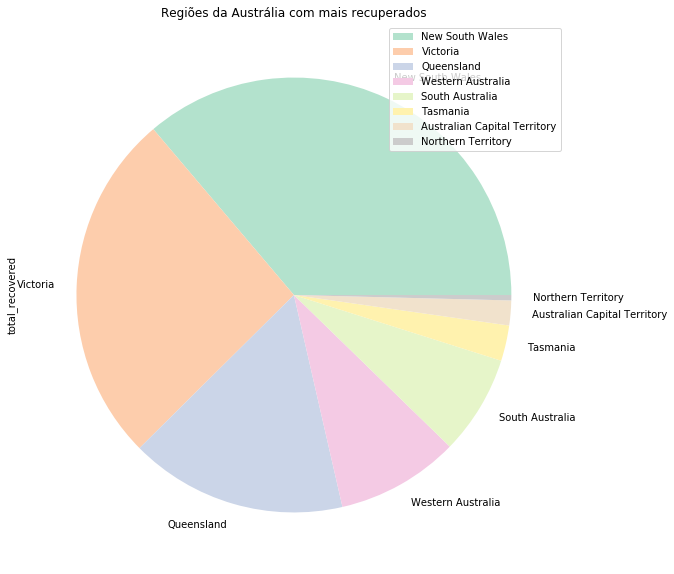

In [39]:
AustraliaRegioesR.plot(kind='pie', y='total_recovered',title='Regiões da Austrália com mais recuperados',colormap='Pastel2', figsize=(16,10)) 
plt.savefig('Figuras/TopRegioesAustraliaRecuperados.png', bbox_inches='tight')

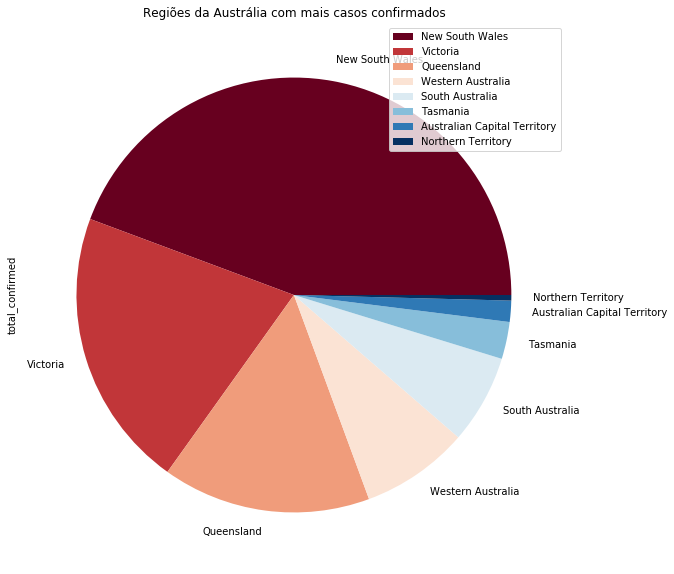

In [40]:
AustraliaRegioesC=AustraliaRegioes.sort_values(by='total_confirmed',ascending=False)
AustraliaRegioesC=AustraliaRegioesC.head(10)
AustraliaRegioesC.plot(kind='pie', y='total_confirmed',title='Regiões da Austrália com mais casos confirmados',colormap='RdBu', figsize=(16,10)) 
plt.savefig('Figuras/TopRegioesAustraliaCasos.png', bbox_inches='tight')

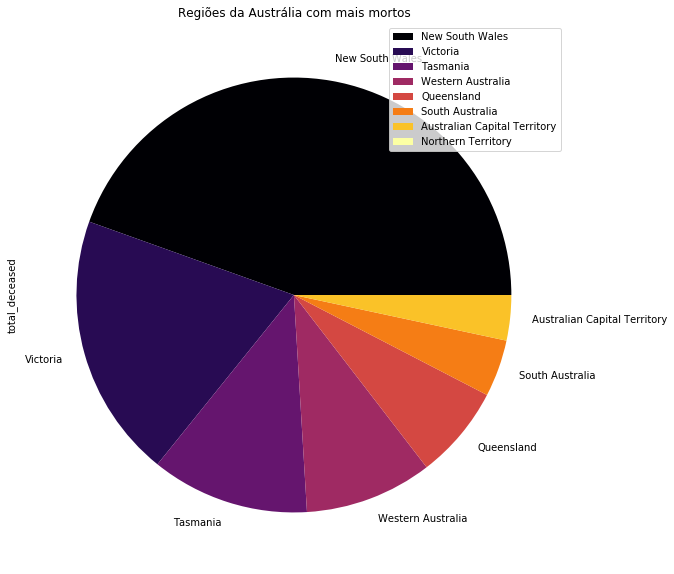

In [26]:
AustraliaRegioesM=AustraliaRegioes.sort_values(by='total_deceased',ascending=False)
AustraliaRegioesM=AustraliaRegioesM.head(10)
AustraliaRegioesM.plot(kind='pie', y='total_deceased',title='Regiões da Austrália com mais mortos',colormap='inferno', figsize=(16,10)) 
plt.savefig('Figuras/TopRegioesAustraliaMortos.png', bbox_inches='tight')

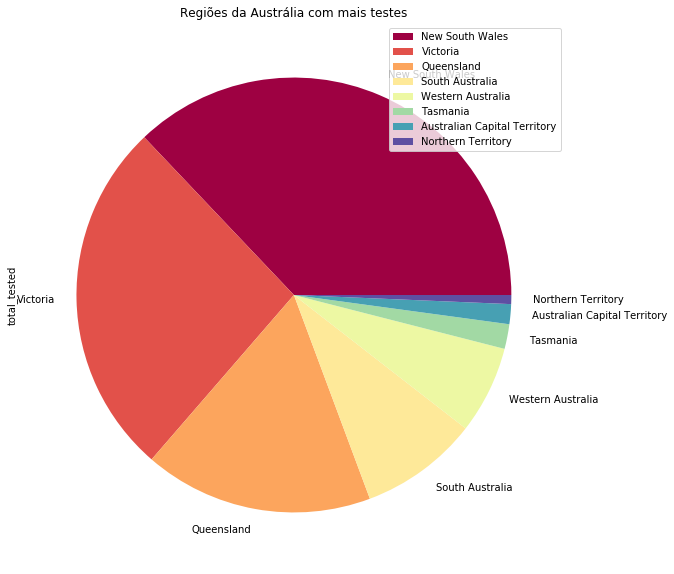

In [27]:
AustraliaRegioesT=AustraliaRegioes.sort_values(by='total_tested',ascending=False)
AustraliaRegioesT=AustraliaRegioesT.head(10)
AustraliaRegioesT.plot(kind='pie', y='total_tested',title='Regiões da Austrália com mais testes',colormap='Spectral',figsize=(16,10)) 
plt.savefig('Figuras/TopRegioesAustraliaTestados.png', bbox_inches='tight')

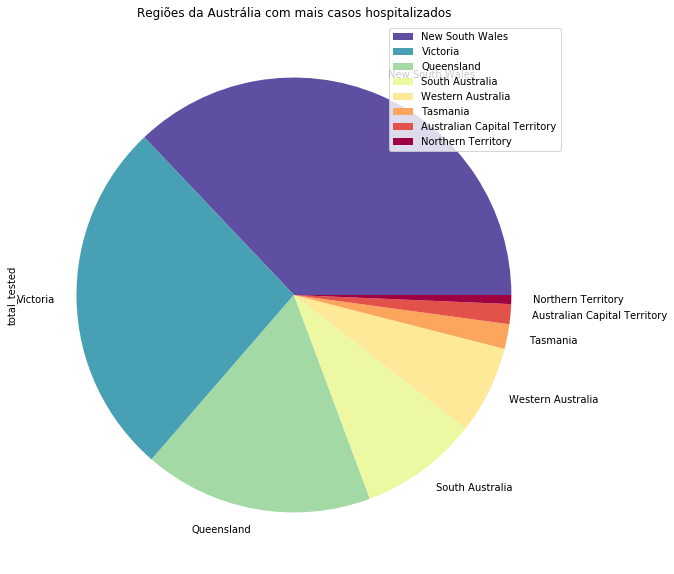

In [28]:
AustraliaRegioesH=AustraliaRegioes.sort_values(by='total_tested',ascending=False)
AustraliaRegioesH=AustraliaRegioesH.head(10)
AustraliaRegioesH.plot(kind='pie', y='total_tested',title='Regiões da Austrália com mais casos hospitalizados',colormap='Spectral_r',figsize=(16,10)) 
plt.savefig('Figuras/TopRegioesAustraliaHospitalizados.png', bbox_inches='tight')

### Ver top 10 países com mais casos confirmados, mais mortos e mais recuperados

Voltou-se a selecionar as colunas desejadas para estas estatísticas.

In [23]:
dadosCompletos=pd.read_csv("Dados/master.csv")
dadosCompletos=dadosCompletos[['date','key','country_name','total_confirmed','total_deceased','total_recovered','total_tested','total_hospitalized','total_intensive_care' ]]

Agrupou-se os dados pelo nome do país com a soma total dos confirmados, dos mortos, dos recuperados e dos hospitalizados.
De seguida, criou-se um novo ficheiro csv com esses valores.

In [24]:
dadosCompletos1=dadosCompletos.groupby('country_name').agg({'total_confirmed' : 'sum', 'total_deceased':'sum','total_recovered':'sum','total_hospitalized':'sum', 'total_tested':'sum','total_intensive_care':'sum'})

dadosCompletos1.to_csv(path_or_buf="C:/Users/claud/OneDrive/Ambiente de Trabalho/UNIVERSIDADE/4ANO/2semestre/SIG/github/Epidemiologia/Projeto Final - A80790/Dados/dadosCompletos.csv")

Abrir o ficheiro csv criado.

In [25]:
dadosCompletos2=pd.read_csv("Dados/dadosCompletos.csv")
dadosCompletos2=dadosCompletos2.set_index('country_name')

Ordenadar os valores de acordo com o valor de confirmados para fazer um gráfico com o top 10 países com mais casos confirmados.

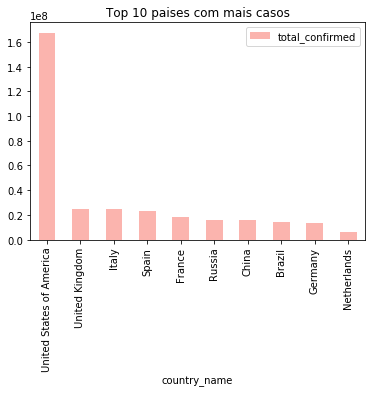

In [26]:
dados3=dadosCompletos2.sort_values(by='total_confirmed',ascending=False)
dados4=dados3.head(10)
dados4.plot(kind='bar', y='total_confirmed',title='Top 10 paises com mais casos', colormap='Pastel1') 
plt.savefig('Figuras/Top10paisesCasos.png', bbox_inches='tight')

Ordenadar os valores de acordo com o valor de mortos para fazer um gráfico com o top 10 países com mais mortos.

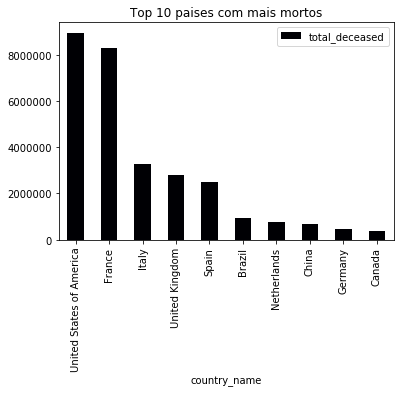

In [27]:
dados5=dadosCompletos2.sort_values(by='total_deceased',ascending=False)
dados6=dados5.head(10)
dados6.plot(kind='bar', y='total_deceased',title='Top 10 paises com mais mortos',colormap='inferno') 
plt.savefig('Figuras/Top10paisesMortes.png', bbox_inches='tight')

Ordenadar os valores de acordo com o valor de recuperados para fazer um gráfico com o top 10 países com mais recuperados.

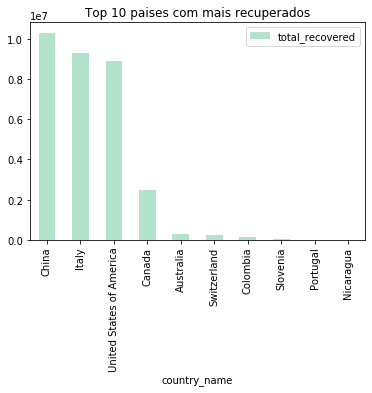

In [28]:
dados7=dadosCompletos2.sort_values(by='total_recovered',ascending=False)
dados8=dados7.head(10)
dados8.plot(kind='bar', y='total_recovered',title='Top 10 paises com mais recuperados',colormap='Pastel2') 
plt.savefig('Figuras/Top10paisesRecuperados.png', bbox_inches='tight')

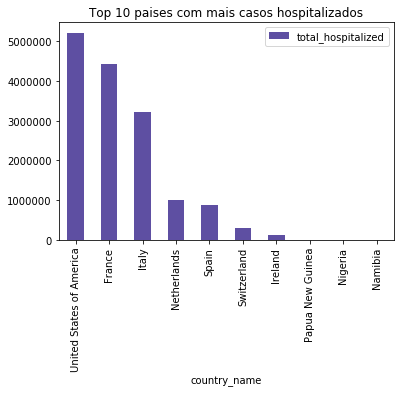

In [29]:
dados9=dadosCompletos2.sort_values(by='total_hospitalized',ascending=False)
dados10=dados9.head(10)
dados10.plot(kind='bar', y='total_hospitalized',title='Top 10 paises com mais casos hospitalizados',colormap='Spectral_r') 
plt.savefig('Figuras/Top10paisesHospitalizados.png', bbox_inches='tight')

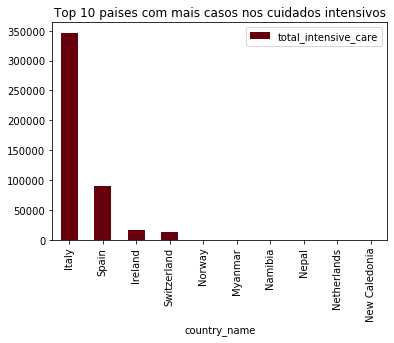

In [38]:
dados11=dadosCompletos2.sort_values(by='total_intensive_care',ascending=False)
dados12=dados11.head(10)
dados12.plot(kind='bar', y='total_intensive_care',title='Top 10 paises com mais casos nos cuidados intensivos',colormap='Reds_r') 
plt.savefig('Figuras/Top10paisesNosUCI.png', bbox_inches='tight')

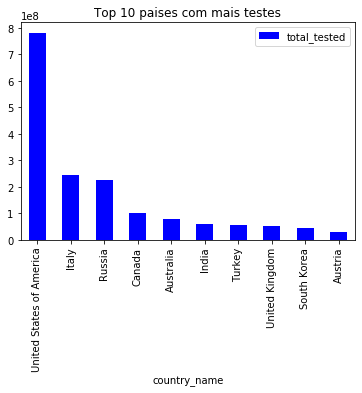

In [40]:
dados13=dadosCompletos2.sort_values(by='total_tested',ascending=False)
dados14=dados13.head(10)
dados14.plot(kind='bar', y='total_tested',title='Top 10 paises com mais testes',colormap='winter') 
plt.savefig('Figuras/Top10paisesTestes.png', bbox_inches='tight')